# Preprocessing Steps

In this notebook, I will outline a couple of key preprocessing steps we could possibly use in order to acquire a better representation of our data.

In [17]:
import sys
import numpy as np
sys.path.insert(0, '/home/emmanuel/projects/2020_ml_ocn/ml4ocean/src')

from data.make_dataset import DataLoad

import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('ggplot')

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Inputs

In [18]:
dataloader = DataLoad()

X, y = dataloader.load_control_data('na')

X = X[dataloader.core_vars + dataloader.loc_vars]
y = y.drop(dataloader.meta_vars, axis=1)

## Visualize PairPlots

<Figure size 576x576 with 0 Axes>

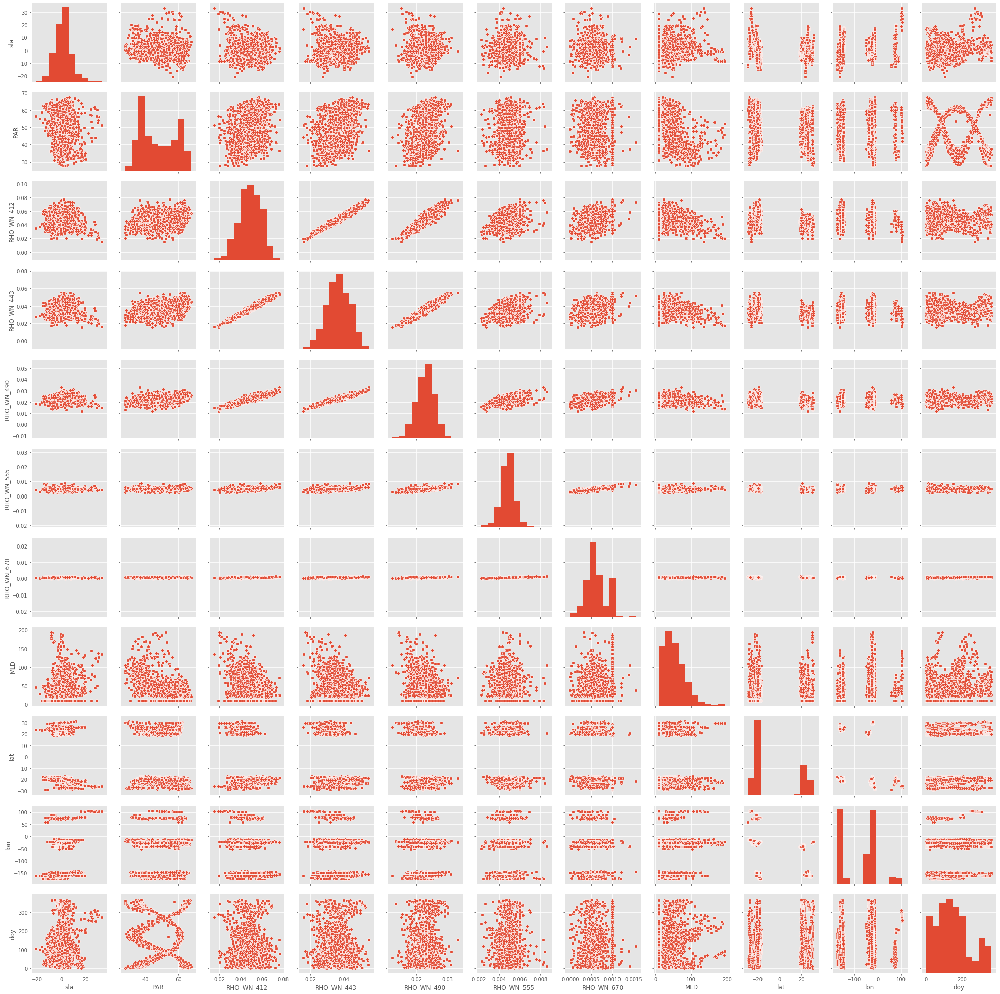

In [16]:
fig = plt.figure(figsize=(8,8))

pts = sns.pairplot(X)

plt.show()

Some immediate observations:

* We need to normalize
* There are some serious skewed distributions
    * MLD

## Standard Preprocessing

### Standardization

The is a super common transformation and it's typically the transformation we start with. It just involves removing the mean, $\mu$ and the standard deviation $\sigma$.

$$\tilde{x} = \frac{x - \mu_x}{\sigma_x}$$

We can use the sklearn function `sklearn.preprocessing.StandardScaler()` to perform the normalization.

**Note**: I don't tranasform the lat, lon, doy coordinates. I think think there are smarter transformations for those variables. Outlined below.

In [58]:
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer, make_column_transformer


transformer = StandardScaler(with_mean=True, with_std=True)
X_transformer = make_column_transformer((transformer, dataloader.core_vars))

X_ = X_transformer.fit_transform(X)
X_norm = X.copy()
X_norm[dataloader.core_vars] = X_

In [57]:
X_norm.shape

(3022, 8)

<Figure size 576x576 with 0 Axes>

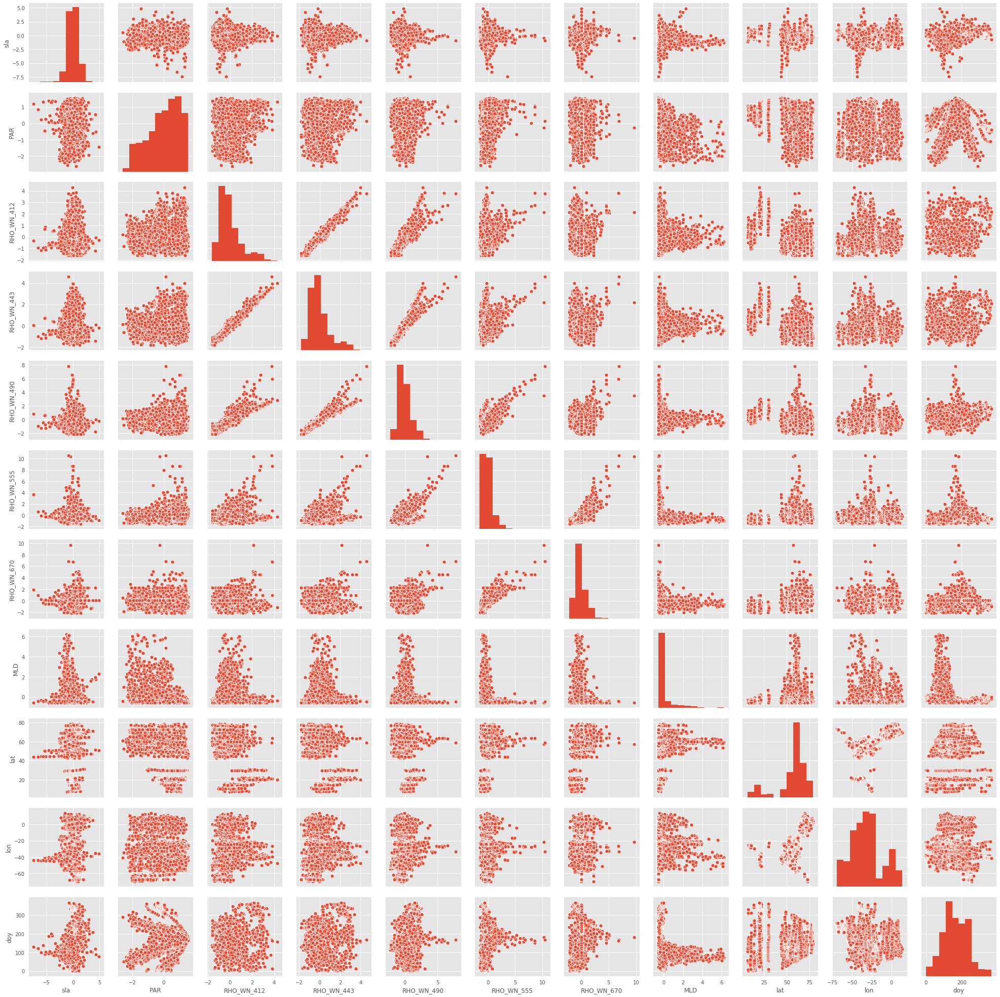

In [59]:
fig = plt.figure(figsize=(8,8))

pts = sns.pairplot(X_norm)

plt.show()

This is necessary as now there is more spread among the points.

### Log Transformation

This is a very simple but a very common transformation used in the sciences. I think it will highlight some of aspects near the surface because it essentially scales the regions near the beginning of the distribution. This is very similar to what we observed in our outputs. It might not be necessary for all of our inputs but it will probably be necessary for the outputs. I have heard the transforming the Mixed Layer Depth (MLD) might also improve the representation as well.

$$\tilde{X} = log(X)$$
$$X = \exp{\tilde{X}}$$


#### Inputs

We can use the sklearn function `sklearn.preprocessing.FunctionTransformer` to apply the logarithmic transformation. We can also use the `sklearn.compose.ColumnTransformer` to ensure that we only apply it to columns that interest us.

**Variables**

* MLD


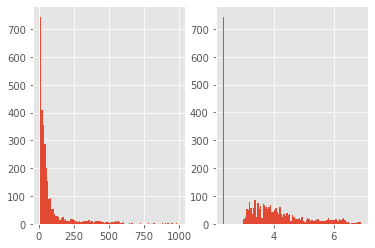

In [8]:
X_mld = X['MLD']

# Do a histogram plot
fig, ax = plt.subplots(ncols=2)

ax[0].hist(X_mld, bins=100)
ax[1].hist(np.log(X_mld), bins=100)

plt.show()

In [9]:
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.preprocessing import FunctionTransformer

transformer = FunctionTransformer(np.log, validate=True)
mld_transformer = make_column_transformer((transformer, ['MLD']))

# Use original data before the normalization above
X_mld = mld_transformer.fit_transform(X)

X_norm = X.copy()

X_norm['MLD'] = X_mld

# # perform standardization on entire dataset
# X_norm = normalizer.fit_transform(X_norm)
# X_norm = pd.DataFrame(X_norm, columns=X.columns)

<Figure size 576x576 with 0 Axes>

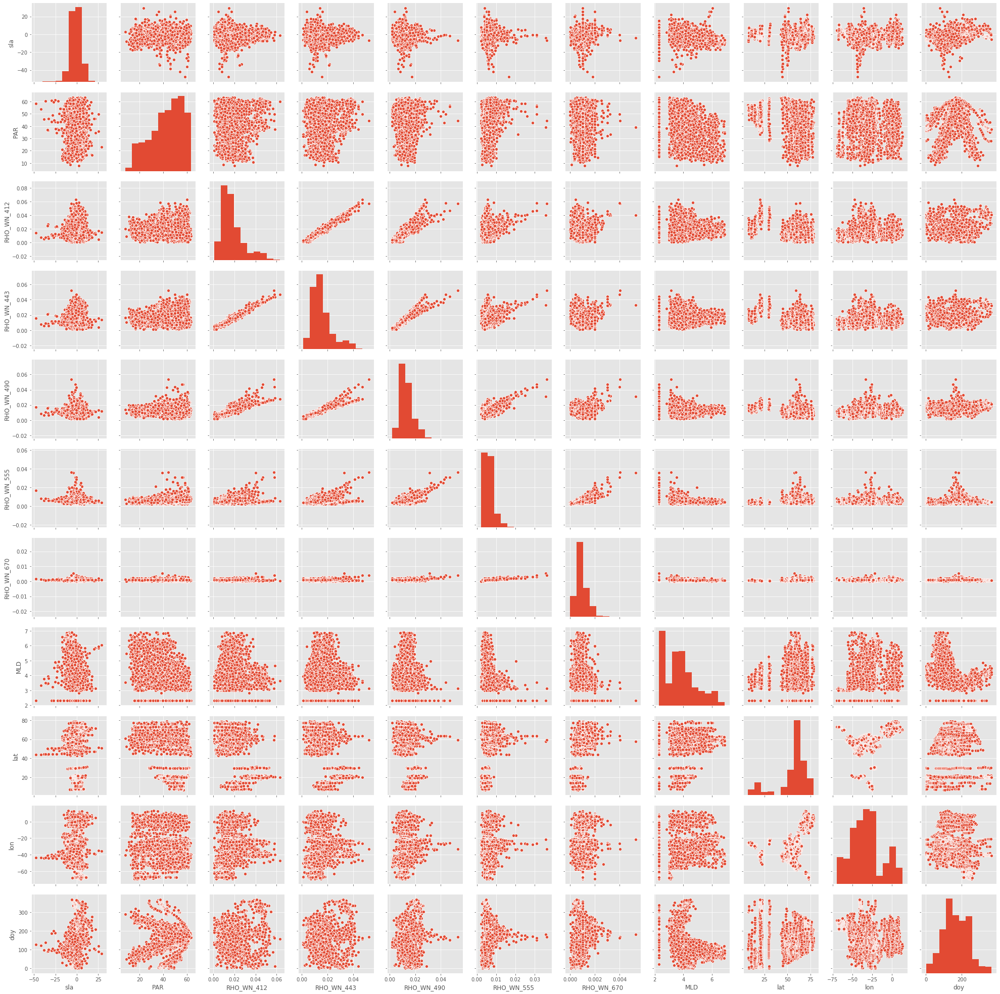

In [10]:
fig = plt.figure(figsize=(8,8))

pts = sns.pairplot(X_norm)

plt.show()

So I see some potential problems with this because we will have some values that are near the zero boundary. I imagine it's because we have a lot of little values...

In [39]:
X_norm.describe()

,sla,PAR,RHO_WN_412,RHO_WN_443,RHO_WN_490,RHO_WN_555,RHO_WN_670,MLD
count,3.022000e+03,3.022000e+03,3.022000e+03,3.022000e+03,3.022000e+03,3.022000e+03,3.022000e+03,3.022000e+03
mean,9.404934e-18,2.539332e-16,-1.504789e-16,-3.009579e-16,-2.445283e-16,1.928011e-16,-1.504789e-16,-3.761973e-17
std,1.000165e+00,1.000165e+00,1.000165e+00,1.000165e+00,1.000165e+00,1.000165e+00,1.000165e+00,1.000165e+00
min,-7.451899e+00,-2.618536e+00,-1.627284e+00,-1.811361e+00,-2.183668e+00,-1.508404e+00,-2.161593e+00,-5.651610e-01
25%,-5.908267e-01,-6.817573e-01,-6.593998e-01,-6.749789e-01,-6.058872e-01,-5.933919e-01,-6.876264e-01,-4.965066e-01
50%,-6.083157e-03,1.485573e-01,-2.812192e-01,-2.433978e-01,-1.876483e-01,-1.896061e-01,4.878115e-02,-3.591977e-01
75%,6.232650e-01,8.441899e-01,3.735554e-01,3.738756e-01,4.245192e-01,3.184635e-01,4.072346e-01,-7.084903e-02
max,4.837737e+00,1.555551e+00,4.291001e+00,4.579740e+00,7.789880e+00,1.051889e+01,9.662698e+00,6.197302e+00


### Coordinate Transformation

* [Coordinate Systems](https://vvvv.org/blog/polar-spherical-and-geographic-coordinates#geographic-coordinates)

<Figure size 576x576 with 0 Axes>

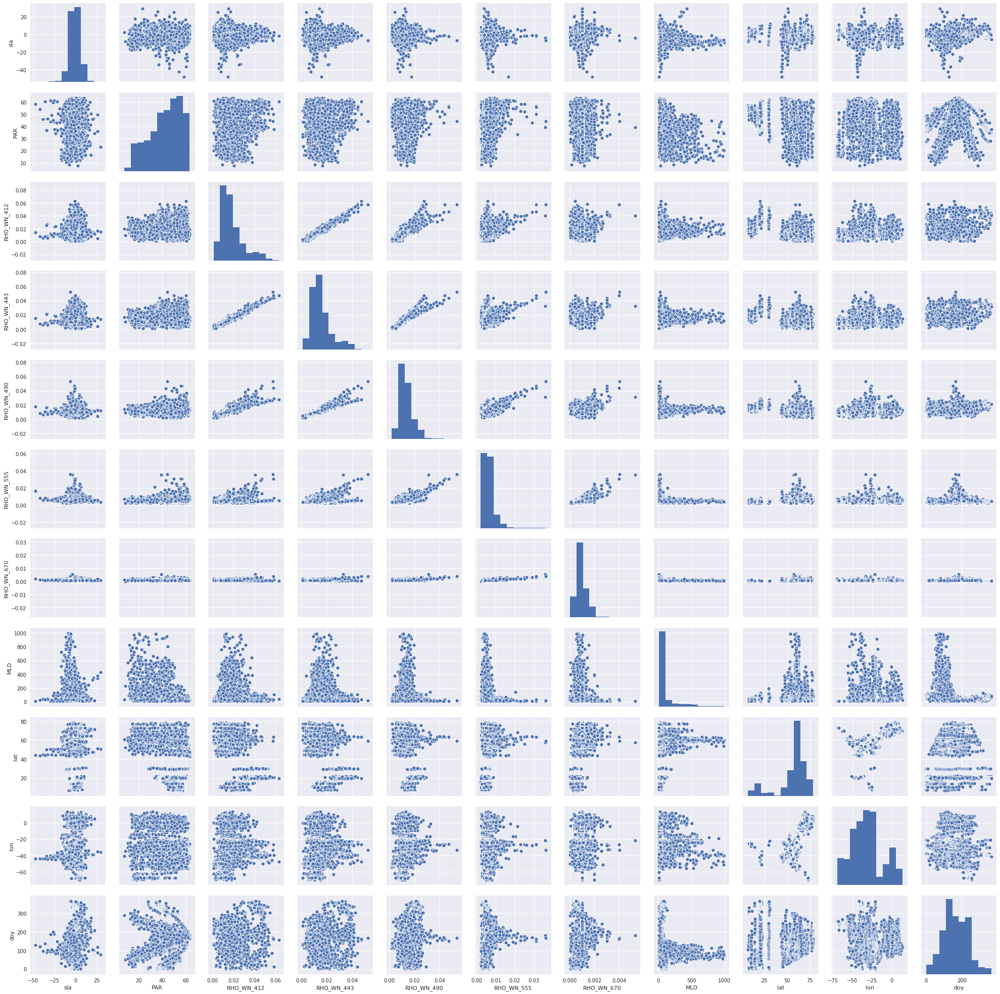

In [48]:
fig = plt.figure(figsize=(8,8))

pts = sns.pairplot(X)

plt.show()

In [41]:
from features.build_features import times_2_cycles, geo_2_cartesian

X = geo_2_cartesian(X)
X.describe()

,sla,PAR,RHO_WN_412,RHO_WN_443,RHO_WN_490,RHO_WN_555,RHO_WN_670,MLD,doy,x,y,z
count,3022.000000,3022.000000,3022.000000,3022.000000,3022.000000,3022.000000,3022.000000,3022.000000,3022.000000,3022.000000,3022.000000,3022.000000
mean,-1.023435,42.587315,0.017911,0.015458,0.013138,0.006466,0.000970,92.319656,165.976837,0.424498,-0.278527,0.803373
std,6.241974,13.341398,0.010524,0.007983,0.005180,0.002834,0.000447,145.681095,69.581352,0.166646,0.175314,0.195811
min,-47.530300,7.658160,0.000789,0.001000,0.001829,0.002191,0.000004,10.000000,1.000000,0.102689,-0.723914,0.121478
25%,-4.710750,33.493225,0.010973,0.010070,0.010000,0.004785,0.000662,20.000000,116.000000,0.333212,-0.409115,0.806248
50%,-1.061400,44.568950,0.014952,0.013515,0.012166,0.005929,0.000991,40.000000,161.000000,0.396892,-0.284740,0.869006
75%,2.866325,53.848125,0.021841,0.018442,0.015337,0.007369,0.001151,82.000000,218.000000,0.475388,-0.174620,0.905730
max,29.168600,63.337100,0.063060,0.052012,0.053483,0.036277,0.005287,995.000000,366.000000,0.896169,0.080525,0.980676


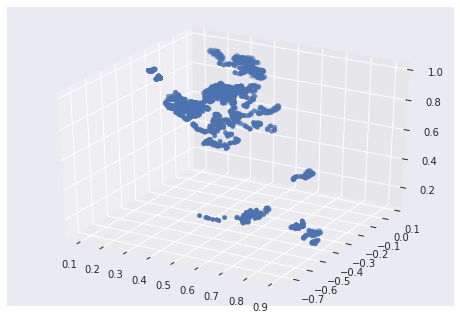

In [42]:
from mpl_toolkits import mplot3d


fig = plt.figure()
ax = plt.axes(projection='3d')

ax.scatter(X['x'], X['y'], X['z'], 'gray')

<Figure size 576x576 with 0 Axes>

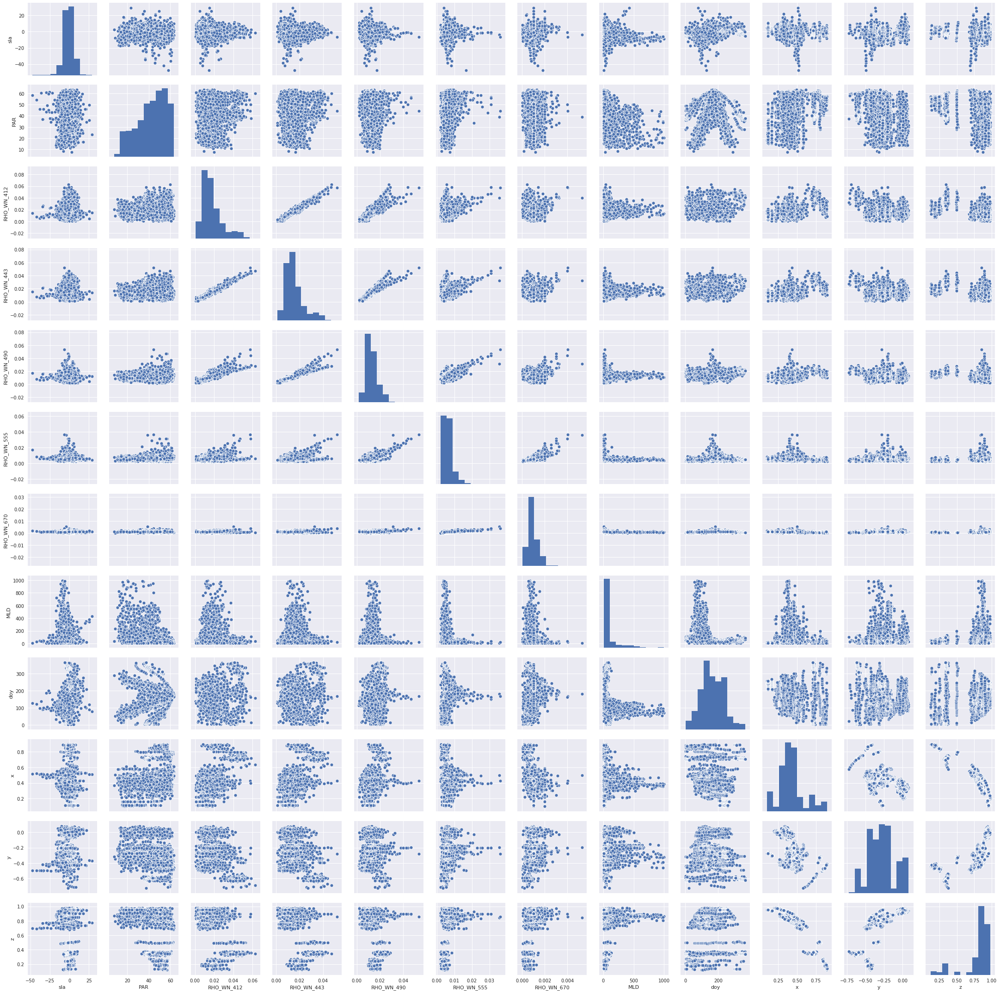

In [49]:
fig = plt.figure(figsize=(8,8))

pts = sns.pairplot(X_rad)

plt.show()

### Day of Year Transformation

For this, it would be preferable that this is a cyclic transformation.

* [Feature Engineering - Handling Cyclical Features](http://blog.davidkaleko.com/feature-engineering-cyclical-features.html)
* [Encoding cyclical continuous features - 24-hour time](https://ianlondon.github.io/blog/encoding-cyclical-features-24hour-time/)

In [45]:
times = ['doy']
X = times_2_cycles(X, times)
X.describe()

,sla,PAR,RHO_WN_412,RHO_WN_443,RHO_WN_490,RHO_WN_555,RHO_WN_670,MLD,x,y,z,doy_sin,doy_cos
count,3022.000000,3022.000000,3022.000000,3022.000000,3022.000000,3022.000000,3022.000000,3022.000000,3022.000000,3022.000000,3022.000000,3022.000000,3022.000000
mean,-1.023435,42.587315,0.017911,0.015458,0.013138,0.006466,0.000970,92.319656,0.424498,-0.278527,0.803373,0.158825,-0.450884
std,6.241974,13.341398,0.010524,0.007983,0.005180,0.002834,0.000447,145.681095,0.166646,0.175314,0.195811,0.695279,0.536955
min,-47.530300,7.658160,0.000789,0.001000,0.001829,0.002191,0.000004,10.000000,0.102689,-0.723914,0.121478,-0.999991,-0.999963
25%,-4.710750,33.493225,0.010973,0.010070,0.010000,0.004785,0.000662,20.000000,0.333212,-0.409115,0.806248,-0.530730,-0.882048
50%,-1.061400,44.568950,0.014952,0.013515,0.012166,0.005929,0.000991,40.000000,0.396892,-0.284740,0.869006,0.313107,-0.618671
75%,2.866325,53.848125,0.021841,0.018442,0.015337,0.007369,0.001151,82.000000,0.475388,-0.174620,0.905730,0.826354,-0.200891
max,29.168600,63.337100,0.063060,0.052012,0.053483,0.036277,0.005287,995.000000,0.896169,0.080525,0.980676,0.999991,1.000000


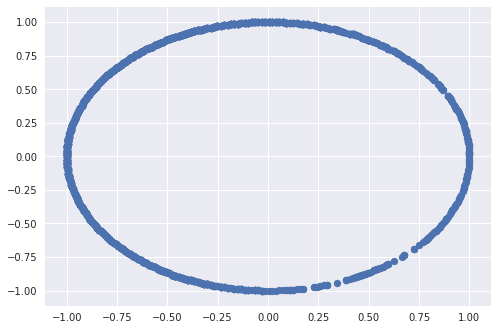

In [46]:
plt.scatter(X['doy_cos'], X['doy_sin'])

### Combining all the tranformations

1. Log Transform (MLD)
2. Coordinate Transform
3. Standardization


**Source**

* [Mixed Column Transform Example](https://scikit-learn.org/stable/auto_examples/compose/plot_column_transformer_mixed_types.html#sphx-glr-auto-examples-compose-plot-column-transformer-mixed-types-py)


## Clustering

So we can do a preprocessing technique by looking at the clusters of the datapoints. We can first find the cluster and then we can plot the locations to see how that helps.

In [19]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import KBinsDiscretizer
from features.build_features import get_geodataframe
from visualization.visualize import plot_geolocations

In [39]:
clf = KMeans(init='k-means++', n_clusters=3, n_init=10, max_iter=1_000, verbose=None)

clf.fit(X)

clusters = clf.predict(X)

In [33]:
clusters_geo = pd.DataFrame(clusters, columns=['clusters'])

clusters_geo['lat'] = X['lat']
clusters_geo['lon'] = X['lon']

clusters_geo = get_geodataframe(clusters_geo)

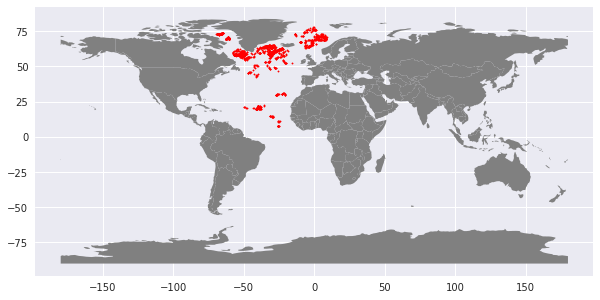

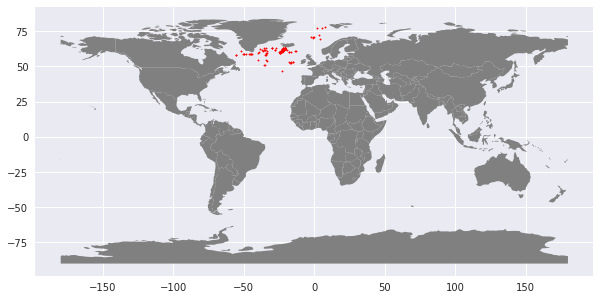

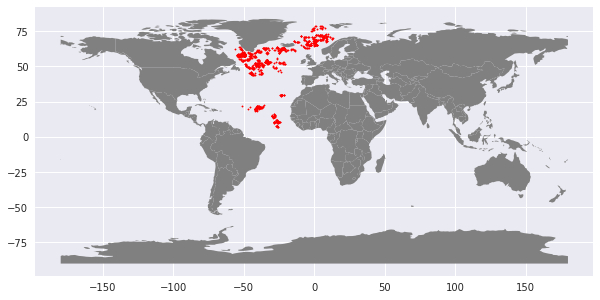

In [40]:
plot_geolocations(clusters_geo[clusters_geo['clusters']==0], color='red')
plot_geolocations(clusters_geo[clusters_geo['clusters']==1], color='red')
plot_geolocations(clusters_geo[clusters_geo['clusters']==2], color='red')


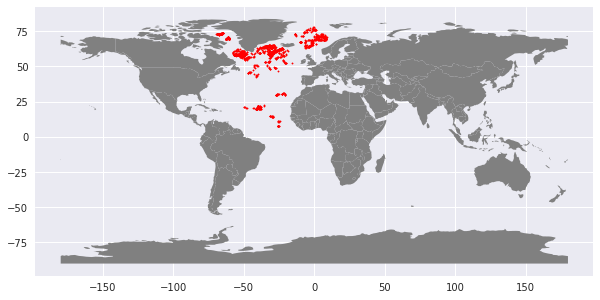

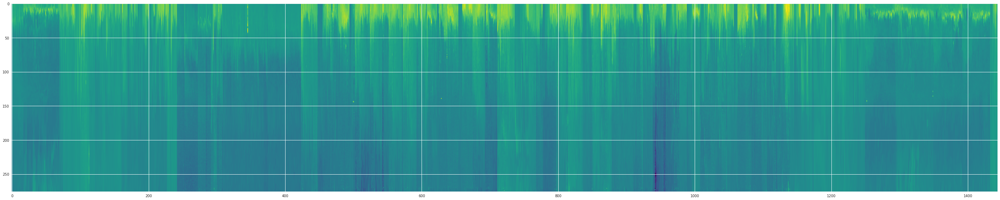

In [34]:
# plot clusters
plot_geolocations(clusters_geo[clusters_geo['clusters']==0], color='red')
plot_bbp_profile(y[clusters == 0])


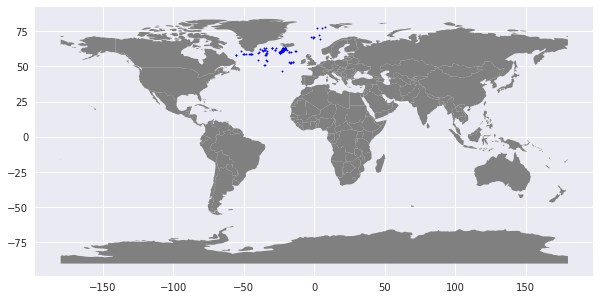

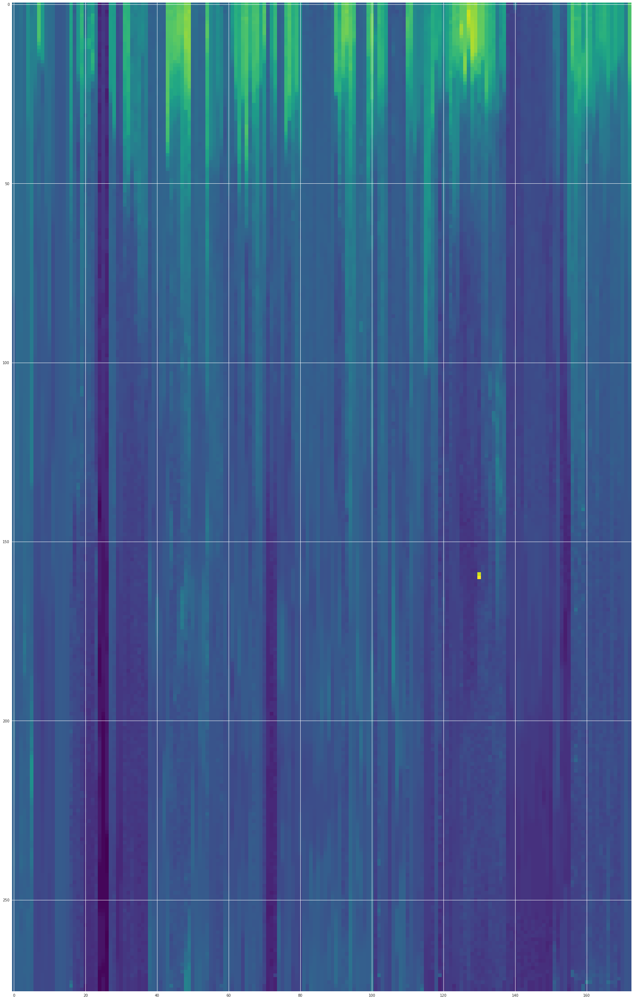

In [35]:
plot_geolocations(clusters_geo[clusters_geo['clusters']==1], color='blue')
plot_bbp_profile(y[clusters == 1])


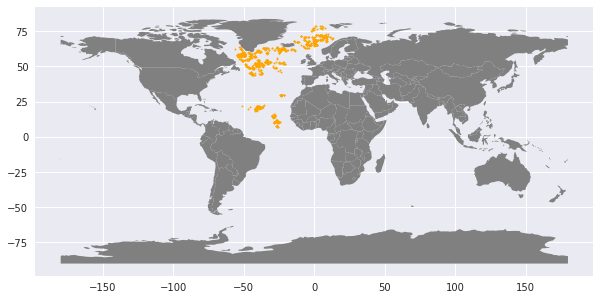

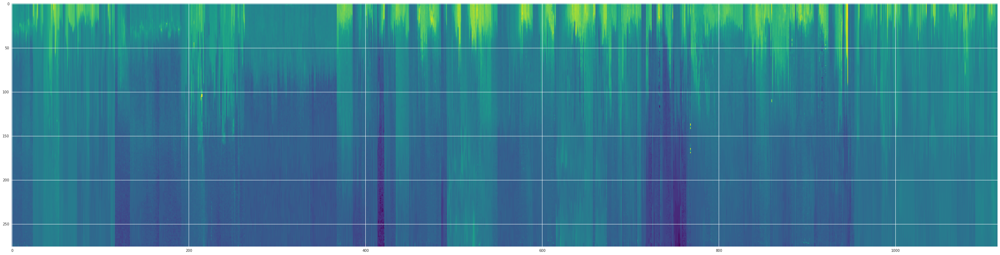

In [36]:
plot_geolocations(clusters_geo[clusters_geo['clusters']==2], color='orange')
plot_bbp_profile(y[clusters == 2])


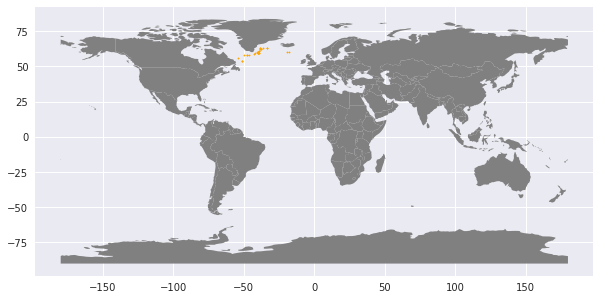

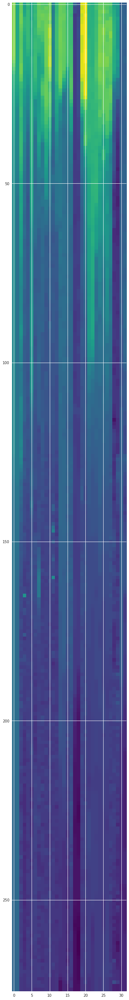

In [37]:
plot_geolocations(clusters_geo[clusters_geo['clusters']==3], color='orange')
plot_bbp_profile(y[clusters == 3])

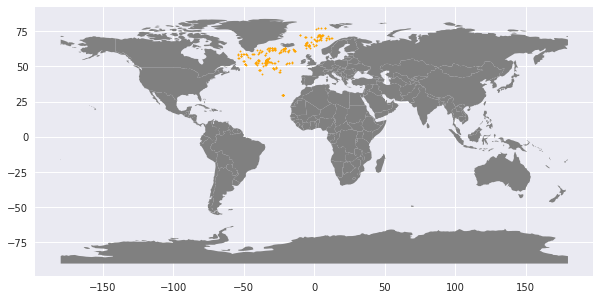

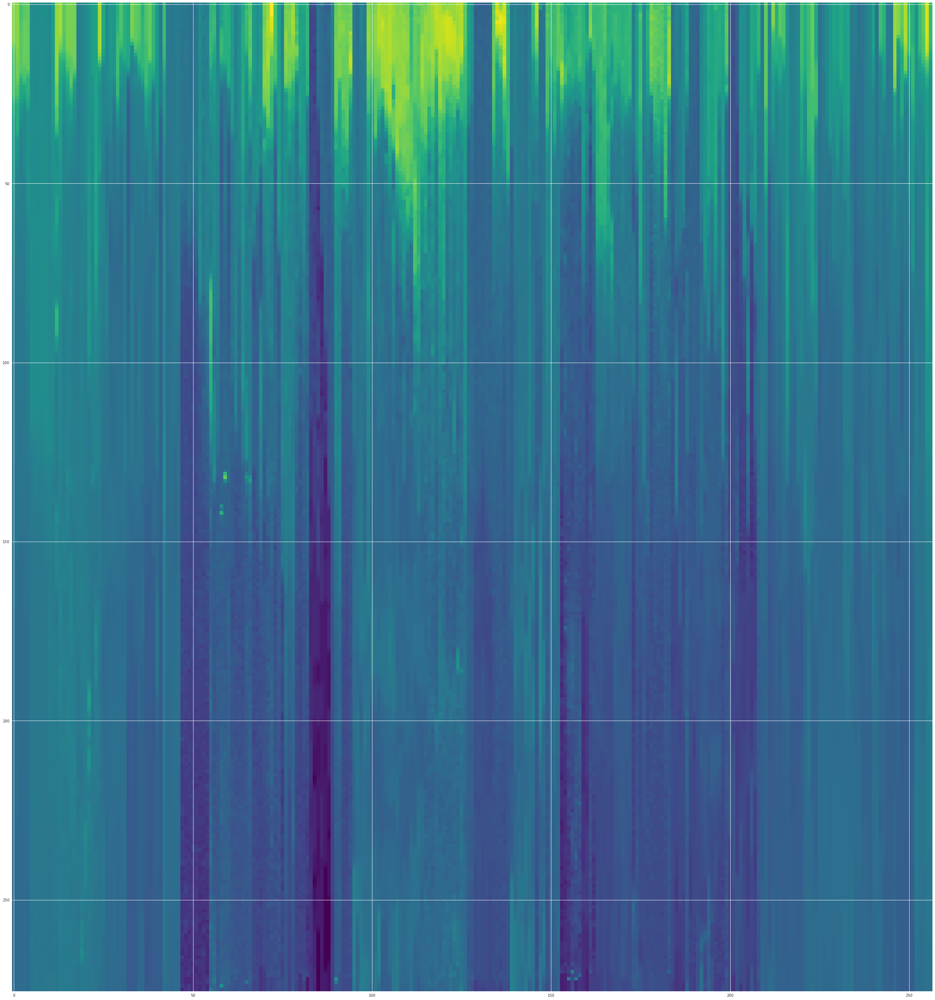

In [38]:
plot_geolocations(clusters_geo[clusters_geo['clusters']==4], color='orange')
plot_bbp_profile(y[clusters == 4])

In [23]:
import matplotlib.colors as colors

def plot_bbp_profile(dataframe: pd.DataFrame):
    norm = colors.LogNorm(vmin=dataframe.values.min()+1e-10, vmax=dataframe.values.max())
    
    fig, ax = plt.subplots(figsize=(50,50))
    ax.imshow(dataframe.T, cmap='viridis', norm=norm)
    plt.show()

In [26]:
y.shape, 

AttributeError: 'numpy.ndarray' object has no attribute 'head'

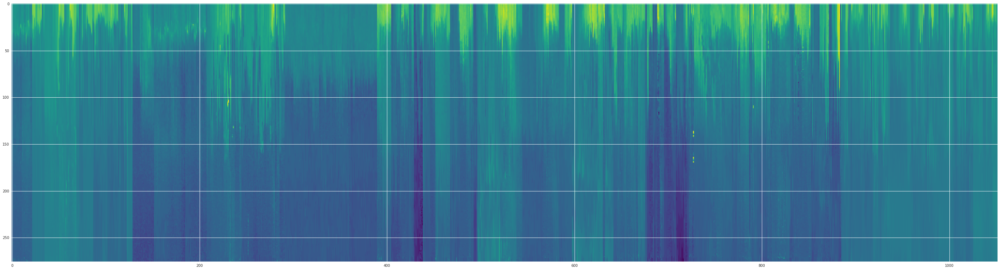

#### Outputs

We can use the sklearn function `sklearn.` to create

### Log Transform

### Standard Scaling (Mean only...)

### KBinsDiscretization